### Multi-Variate Time Series Forecast
In this project, the multi-variate time series forecast(parallel forecast) with applied of  deeplearning algorithm is perfomed. The main idea doing behind this project is how to model multi-variate time series with deeplearnig algorithm  and  classical statistical method like VAR, VARMAX.  

The dataset is taken from <a href='https://archive.ics.uci.edu/ml/datasets/Air+quality'>here</a>.
The dataset  contains  hourly averaged responses of different chemical ions in air  such as CO, Non Metanic Hydrocarbons, Benzene, Total Nitrogen Oxides (NOx) and Nitrogen Dioxide (NO2). Data were recorded from March 2004 to February 2005 (one year). Missing values are tagged with -200 value.

#### Attribute Information:

0 Date (DD/MM/YYYY)<br>
1 Time (HH.MM.SS) <br>
2 True hourly averaged concentration CO in mg/m^3 (reference analyzer) <br>
3 PT08.S1 (tin oxide) hourly averaged sensor response (nominally CO targeted)<br>
4 True hourly averaged overall Non Metanic HydroCarbons concentration in microg/m^3 (reference analyzer) <br>
5 True hourly averaged Benzene concentration in microg/m^3 (reference analyzer)<br>
6 PT08.S2 (titania) hourly averaged sensor response (nominally NMHC targeted) <br>
7 True hourly averaged NOx concentration in ppb (reference analyzer)<br>
8 PT08.S3 (tungsten oxide) hourly averaged sensor response (nominally NOx targeted)<br>
9 True hourly averaged NO2 concentration in microg/m^3 (reference analyzer)<br>
10 PT08.S4 (tungsten oxide) hourly averaged sensor response (nominally NO2 targeted)<br>
11 PT08.S5 (indium oxide) hourly averaged sensor response (nominally O3 targeted)<br>
12 Temperature in Â°C <br>
13 Relative Humidity (%)<br>
14 AH Absolute Humidity

In [586]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image 

# for metric
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import  r2_score

# for finding arima orders
from pmdarima import auto_arima 

# for stationarity test
from statsmodels.tsa.stattools import adfuller 
from statsmodels.tsa.statespace.tools import diff 

#for VAR model
from statsmodels.tsa.api import VAR, VARMAX


# for deeplearning
from sklearn.preprocessing import MinMaxScaler
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.callbacks import EarlyStopping
from keras.utils.vis_utils import plot_model


In [12]:
#ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [5]:
# load dataset and set index
df = pd.read_csv('Data/AirQualityUCI.csv', sep=';', parse_dates= {'Date_time' : ['Date', 'Time']} ) 
df.set_index( pd.to_datetime(df['Date_time'], format = '%d/%m/%Y %H.%M.%S'), inplace= True) #set index
df.drop(columns=['Date_time'], inplace=True) # drop column
df.index.freq ='H' # set freq
df.head(3)

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
Date_time,,,,,,,,,,,,,
2004-03-10 18:00:00,2.06,1360,150,11.09,1046,166,1056,113,1692,1268,13.06,48.9,0.7578
2004-03-10 19:00:00,2.00,1292,112,9.04,955,103,1174,92,1559,972,13.03,47.7,0.7255
2004-03-10 20:00:00,2.02,1402,88,9.00,939,131,1140,114,1555,1074,11.09,54.0,0.7502


In [6]:
# check data types
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9357 entries, 2004-03-10 18:00:00 to 2005-04-04 14:00:00
Freq: H
Data columns (total 13 columns):
CO(GT)           9357 non-null float64
PT08.S1(CO)      9357 non-null int64
NMHC(GT)         9357 non-null int64
C6H6(GT)         9357 non-null float64
PT08.S2(NMHC)    9357 non-null int64
NOx(GT)          9357 non-null int64
PT08.S3(NOx)     9357 non-null int64
NO2(GT)          9357 non-null int64
PT08.S4(NO2)     9357 non-null int64
PT08.S5(O3)      9357 non-null int64
T                9357 non-null float64
RH               9357 non-null float64
AH               9357 non-null float64
dtypes: float64(5), int64(8)
memory usage: 1023.4 KB


#### Impute Missing Values
In the dataset, all the missing values are tagged with -200. Thus, I have  replaced this 
value with just previous value of it since the current time series data are predicted from past values, which makes sense right?

In [11]:
#impute missing
cols = df.columns
for j in cols: #each columns
    for i in range(0,len(df)): # each rows
        if df[j][i] == -200:
            df[j][i] = df[j][i-1] # replace with just previous
            
df.tail(3)

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
Date_time,,,,,,,,,,,,,
2005-04-04 12:00:00,2.04,1142,275,12.04,1063,293,603,175,1241,1092,26.9,18.03,0.6406
2005-04-04 13:00:00,2.01,1003,275,9.05,961,235,702,156,1041,770,28.3,13.05,0.5139
2005-04-04 14:00:00,2.02,1071,275,11.09,1047,265,654,168,1129,816,28.5,13.01,0.5028


#### Visualize Series

In [24]:
# Visualize all time series
fig, axes = plt.subplots(nrows= int(len(df.columns)/2), ncols=2, dpi=400, figsize=(20,30))

for i, ax in enumerate(axes.flatten()): # all subplots
    dataa = df[df.columns[i]]
    ax.plot(dataa, linewidth=1)
    ax.autoscale(axis='x',tight=True) # tight fit to x-axis
    
    # Decorations
    ax.set_title(df.columns[i])
    ax.tick_params(labelsize=10, colors='r')
    

fig.suptitle('Visualize Series: All series', fontsize=25) # figure title
plt.tight_layout()# fit suplots nicely in the figure
fig.subplots_adjust(top=0.95) # adjust figure title
plt.show()

#### Stationary Check
Augmented Dicke-Fuller test is used for stationary check.

In [7]:
# stationary check
def adfuller_test(time_series):
    """
     time_series= single time series data
     returns an ADF report
     
    """
    
    # create adfuller  report
    result = adfuller(time_series, autolag='AIC') 
    
    
    #assigin the each value with name and store as pands series
    labels = ['ADF_test','p-value','lags used','observations']
    out = pd.Series(result[0:4],index=labels) #create series

    for key,val in result[4].items(): # add items(critical values) 
        out[f'critical value ({key})']=val
        
   
    #print out
    print(out)
    
   #check hypothesis 
    if np.round(result[1], 2) <= 0.05:
        print("Strong evidence against  to reject  null hypothesis")
        print("It has no unit root and is stationary")
    else:
        print("Weak evidence against  to reject null hypothesis")
        print("It has unit root and  is non-stationary")

In [17]:
# stationary check 
col_list = df.columns
for x in col_list:
    print(f'Stationary check for {x}:')
    adfuller_test(df[x]) # call adfuller_test()
    print(f'------ ------ ------- -------')
    print()
    

Stationary check for CO(GT):
ADF_test               -9.674180e+00
p-value                 1.253575e-16
lags used               3.700000e+01
observations            9.319000e+03
critical value (1%)    -3.431052e+00
critical value (5%)    -2.861850e+00
critical value (10%)   -2.566935e+00
dtype: float64
Strong evidence against  to reject  null hypothesis
It has no unit root and is stationary
------ ------ ------- -------

Stationary check for PT08.S1(CO):
ADF_test               -9.875915e+00
p-value                 3.883044e-17
lags used               3.700000e+01
observations            9.319000e+03
critical value (1%)    -3.431052e+00
critical value (5%)    -2.861850e+00
critical value (10%)   -2.566935e+00
dtype: float64
Strong evidence against  to reject  null hypothesis
It has no unit root and is stationary
------ ------ ------- -------

Stationary check for NMHC(GT):
ADF_test               -1.066215e+01
p-value                 4.379230e-19
lags used               3.700000e+01
obser

#### Note: 
From this test, We come to know that all the series are stationary

#### Split Data

In [8]:
#split test(30%) and train(70%)
train_data = df.iloc[:int(0.7*len(df))]
test_data = df.iloc[int(0.7*len(df)):]

### Vector AutoRegression (VAR) Model
This VAR model forecasts the multivariate series in parallel at the same time. In this model, the linear combination of past values of the series are happened. It is calculated against a set of lagged values of order 𝑝 . 

The basis behind Vector AutoRegression is that each of the time series in the system influences each other. That is, you can predict the series with past values of itself along with other series in the system.

In [36]:
#create VAR object
var_model =VAR(train_data)
var_result = var_model.fit(maxlags=100, ic='aic')# var lag order selection
var_predica = var_result.forecast(y = train_data.values[-var_result.k_ar:], steps=len(test_data)) # need previous series of lag order

#prediction in dataframe
var_pred_dfa = pd.DataFrame({'CO(GT)_pd': var_predica[:, 0], 'PT08.S1(CO)_pd': var_predica[:, 1],'NMHC(GT)_pd': var_predica[:, 2], 
                             'C6H6(GT)_pd': var_predica[:, 3], 'PT08.S2(NMHC)_pd': var_predica[:, 4], 'NOx(GT)_pd': var_predica[:, 5],
                             'PT08.S3(NOx)_pd':var_predica[:, 6], 'NO2(GT)_pd': var_predica[:, 7], 'PT08.S4(NO2)_pd':var_predica[:, 8],
                             'PT08.S5(O3)_pd': var_predica[:, 9], 'T_pd':var_predica[:, 10], 'RH_pd': var_predica[:, 11], 'AH_pd':var_predica[:, 12]})

#set index
var_pred_dfa.set_index(pd.date_range('2004-12-08 15:00:00', periods= len(test_data), freq='H'), inplace=True)
var_pred_dfa.head(3)

,CO(GT)_pd,PT08.S1(CO)_pd,NMHC(GT)_pd,C6H6(GT)_pd,PT08.S2(NMHC)_pd,NOx(GT)_pd,PT08.S3(NOx)_pd,NO2(GT)_pd,PT08.S4(NO2)_pd,PT08.S5(O3)_pd,T_pd,RH_pd,AH_pd
2004-12-08 15:00:00,4.691051,1092.656972,-203.161604,7.655344,853.685941,237.259435,801.844516,81.972959,1267.667536,988.154789,19.271052,54.083559,2.847413
2004-12-08 16:00:00,-4.381786,1107.461343,-176.100973,9.892512,895.226118,264.531146,817.429113,94.210307,1296.846121,1014.564259,19.937554,53.742076,3.564364
2004-12-08 17:00:00,-6.557550,1135.466711,-185.248837,12.173880,936.965687,284.047067,788.382118,95.072180,1321.124165,1065.957089,20.860111,56.124485,4.930600


#### Plot Test Data with Forecast result

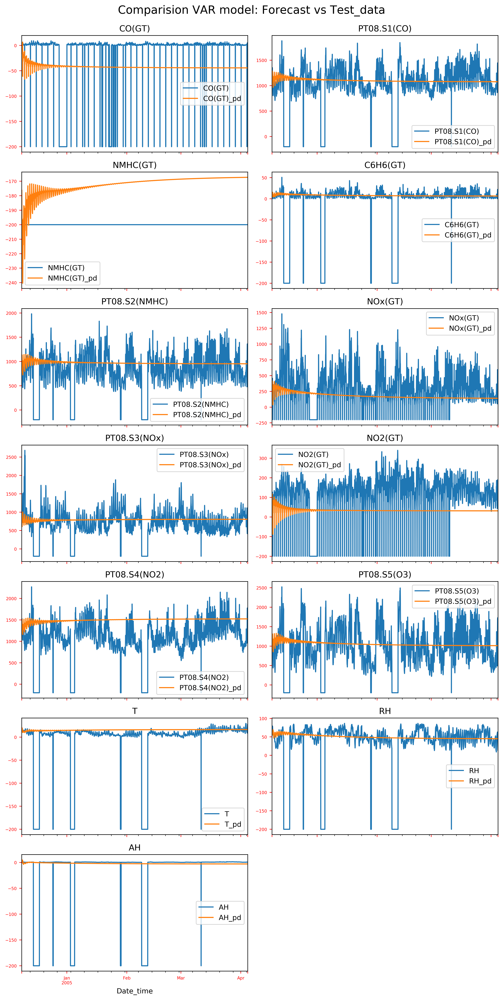

In [37]:
# Visualize Testdata vs Forecast Data
fig, axes = plt.subplots(nrows= 7, ncols=2,  sharex=True, dpi=400, figsize=(10,20)) # 7 rows and 2 columns
fig.suptitle('Comparision VAR model: Forecast vs Test_data', fontsize=16) # figure title 

for i, ax in enumerate(axes.flatten()): # all subplots
    
    if i < test_data.shape[1]: # check columns in data frame
       
        #plot test data
        data_t = test_data[test_data.columns[i]]
        data_t.plot(legend= True, ax= ax)

        #plot predicted values
        data_p = var_pred_dfa[var_pred_dfa.columns[i]]
        data_p.plot(legend= True, ax= ax)
        ax.autoscale(axis='x', tight=True) # tight fit to x-axis

        # Decorations
        ax.set_title(df.columns[i]) # subplot tittle
        ax.tick_params(labelsize=6, colors='r') 
        
fig.delaxes(axes[-1][1] )# delete unused axes 
fig.tight_layout() # nicely fit subplots
fig.subplots_adjust(top=0.95) # adjust figure title
plt.show()

##### Observation: 
We can see that the prediction lines by VAR model are pretty much the middle(average) values of series rather than fitting to the  up and dowons in the series.

#### Evaluate VAR Model

In [38]:
# metrix (rmse and r2_score)
for x, y in zip(test_data, var_pred_dfa):
    rme = rmse(test_data[x], var_pred_dfa[y]) 
    print(f'{x} RMSE error: {rme}')
    print()

CO(GT) RMSE error: 59.87030766945913

PT08.S1(CO) RMSE error: 419.4256643866329

NMHC(GT) RMSE error: 28.299780528558447

C6H6(GT) RMSE error: 58.551964185208405

PT08.S2(NMHC) RMSE error: 418.8811739871176

NOx(GT) RMSE error: 280.10214121556214

PT08.S3(NOx) RMSE error: 369.64355189350476

NO2(GT) RMSE error: 128.11835838854344

PT08.S4(NO2) RMSE error: 633.519076060874

PT08.S5(O3) RMSE error: 554.5899507332482

T RMSE error: 60.452405400815685

RH RMSE error: 72.40696439494984

AH RMSE error: 55.42305273576012



### VARMAX model
It is the combinatin of AR and MA. AR is the linear combination of lagged values of order 'p' and MA uses the past forecast errors of order 'q' in a regression-like mode . As like VAR, this model is also used for multile variable forecast at same time. The time series in the system influences each other. 


##### Tune Parameter (p,q)

In [14]:
# find parameter(p,q) for all series
for x in df.columns:
    print(f'Order for {x}')
    print(auto_arima(df[[x]], maxiter=1000)) # auto_arima()
    print()

Order for CO(GT)
ARIMA(callback=None, disp=0, maxiter=1000, method=None, order=(5, 1, 5),
      out_of_sample_size=0, scoring='mse', scoring_args=None,
      seasonal_order=(0, 0, 0, 1), solver='lbfgs', start_params=None,
      suppress_warnings=False, transparams=True, trend=None,
      with_intercept=True)

Order for PT08.S1(CO)
ARIMA(callback=None, disp=0, maxiter=1000, method=None, order=(2, 1, 2),
      out_of_sample_size=0, scoring='mse', scoring_args=None,
      seasonal_order=(0, 0, 0, 1), solver='lbfgs', start_params=None,
      suppress_warnings=False, transparams=True, trend=None,
      with_intercept=True)

Order for NMHC(GT)
ARIMA(callback=None, disp=0, maxiter=1000, method=None, order=(4, 1, 5),
      out_of_sample_size=0, scoring='mse', scoring_args=None,
      seasonal_order=(0, 0, 0, 1), solver='lbfgs', start_params=None,
      suppress_warnings=False, transparams=True, trend=None,
      with_intercept=True)

Order for C6H6(GT)
ARIMA(callback=None, disp=0, maxiter=1000

##### Note:
Even though we already  come to know that our sereies are stationary  with adf test, auot_arima() has
suggested  1 differencing with all the series. We can do again one difference and fit  the data
for model. But for now, i will used the series directly with out differencing since with 95% confidence level
the sereis are stationary which we know from adf test. 

I have average the all (p,q) order values and use to build the model. Or you may use other ways, for example use each order and compare the 'AIC'. The lowest the AIC score better the model perfome.

##### Build model

In [27]:
# Build model
varma_model =VARMAX(train_data, order=(4,3), trend='c') # (p,q) as average of all orders
varma_result = varma_model.fit(maxiter=100, disp= False)


In [33]:
# forecast
varma_predica = varma_result.forecast(test_data.shape[0]) # forecast as test set
varma_predica.head(3)

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
2004-12-08 15:00:00,1.948702,1095.403861,-198.750587,7.052586,840.474773,217.691900,816.714380,60.169676,1263.023985,983.841206,18.070140,54.927810,2.105622
2004-12-08 16:00:00,-11.359390,1101.790447,-195.730237,7.483554,850.577843,219.185558,841.115006,52.864530,1279.988198,980.455250,17.362273,55.206503,1.673175
2004-12-08 17:00:00,-14.392275,1101.014511,-195.650241,8.008488,857.752037,243.180354,855.189011,65.451185,1291.577250,977.154784,16.867626,56.085439,1.533536


##### Visualize Testdata vs Forecast Data

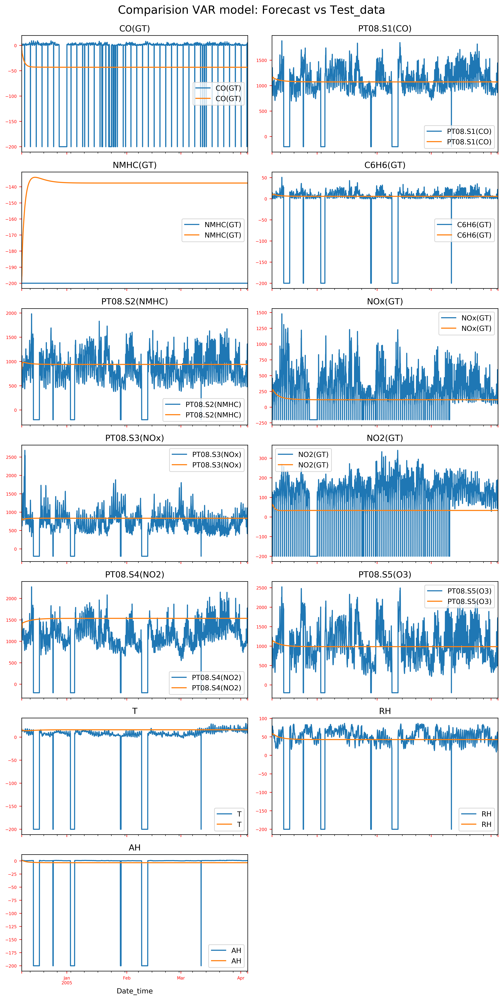

In [32]:
# create figures
fig, axes = plt.subplots(nrows= 7, ncols=2,  sharex=True, dpi=400, figsize=(10,20)) # 7 rows and 2 columns
fig.suptitle('VARMAX model: Comparision Forecast vs Test_data', fontsize=16) # figure title 

for i, ax in enumerate(axes.flatten()): # all subplots 
    
    if i < test_data.shape[1]: # check columns in data frame
       
        #plot test data
        data_t = test_data[test_data.columns[i]]
        data_t.plot(legend= True, ax= ax)

        #plot predicted values
        data_p = varma_predica[varma_predica.columns[i]]
        data_p.plot(legend= True, ax= ax)
        ax.autoscale(axis='x', tight=True) # tight fit to x-axis

        # Decorations
        ax.set_title(df.columns[i]) # subplot tittle
        ax.tick_params(labelsize=6, colors='r')  
        
fig.delaxes(axes[-1][1] )# delete unused axes 
fig.tight_layout() # nicely fit subplots
fig.subplots_adjust(top=0.95) # adjust figure title
plt.show()


##### Evaluate VARMAX model

In [41]:
# metrix (rmse)
for x, y in zip(test_data, varma_predica):
    rme = rmse(test_data[x], varma_predica[y]) 
    print(f'{x} RMSE error: {rme}')
    print()

CO(GT) RMSE error: 60.04126149878454

PT08.S1(CO) RMSE error: 410.93765075538346

NMHC(GT) RMSE error: 62.229808402465075

C6H6(GT) RMSE error: 57.78949612809797

PT08.S2(NMHC) RMSE error: 407.75552818132957

NOx(GT) RMSE error: 311.7266119049629

PT08.S3(NOx) RMSE error: 384.13012086896566

NO2(GT) RMSE error: 129.02577101522422

PT08.S4(NO2) RMSE error: 659.1349785777069

PT08.S5(O3) RMSE error: 546.1272897830743

T RMSE error: 60.63841636285045

RH RMSE error: 70.36126242669742

AH RMSE error: 54.97301271966997



### Deep Learning
I have used vanilla LSTM for forecasting the multiple time series. We have to change times series data into supervised learning dataset( current value is predicted from previous values). For this, I have used keras TimeseriesGenerator().

Early stoping is used to avoid the model overfitting.

#### Split and Normalize dataset

In [633]:
#Normalize data
scaler = MinMaxScaler((0,1))
train_data_scaled = scaler.fit_transform(train_data) # scale (0,1)

# validation and testset(90-10% of test data)
valid_set = test_data.iloc[:int(test_data.shape[0]*0.9)]
valid_data_scaled = scaler.fit_transform(valid_set) # validation set

test_set = test_data.iloc[int(test_data.shape[0]*0.9):]
test_data_scaled = scaler.fit_transform(test_set) #testset 


In [697]:
# stops training when it doesn't show improvemnet
early_stop = EarlyStopping(monitor='val_loss', patience=5) 

#create lstm model
def create_lstm_model(data_t, lag_time, feature_num,  epoch, data_v=None):
    '''
    data_t=  train dataset (time series generator)
    data_v = validation datadset (time series generator)
    lag_time = no. previous timespan
    feature_no = no. of input features
    epoch = no. of eoch 
    
    return  LSTM model
    '''
    lstm_model = Sequential()
    lstm_model.add(LSTM(50, activation='relu', input_shape=(lag_time, feature_num)))
    lstm_model.add(Dense(1)) # output layer
                   
    #compile 
    lstm_model.compile(optimizer='adam', loss='mae', metrics=['mae'])
    
    #print model summary
    print(f'Model summary:')
    print(lstm_model.summary())
    
    
    # fit model
    lstm_model.fit_generator(data_t, validation_data=data_v, callbacks=[early_stop],  epochs=epoch)
                   
    return lstm_model
                   

##### Function to convert series to supervised learning

In [622]:
# convert series into supervised learning dataset
def series_to_supervised(df ):
    '''
    return supervised learning dataet
    
    df = time sereies
    '''
    
    lag_time = 2 # time span
    X_train=[]  # train input features
    y_train=[]  # train predicted(dependent values)
    
    for i in range(len(df)-lag_time-1): 
        t=[]
        for j in range(0,lag_time):

            t.append(df.values[[(i+j)], :]) # input features
            X_train.append(t)
            y_train.append(df.values[i+ lag_time, :]) # values to predict
    X, y= np.array(X_train), np.array(y_train) # change numpy array
            
    return X, y

##### Convert series to Supervised Learning dataset 
for example: x-1 --> x,  x --> x+1, x+1 --> x+2

In [623]:
#set parameter for TimeseriesGenerator()
lag_time = 1 # time lags
feature_num = train_data.shape[1] # feature number
batch_size = 1
train_generator = TimeseriesGenerator(train_data_scaled, train_data_scaled, 
                                       length = lag_time, 
                                       batch_size= batch_size)
valid_generator = TimeseriesGenerator(valid_data_scaled, valid_data_scaled, 
                                       length = lag_time, 
                                       batch_size= batch_size)

# call  create_lstm_model()
model = create_lstm_model(train_generator, lag_time, feature_num, 30, valid_generator)

Model summary:
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_20 (LSTM)               (None, 50)                12800     
_________________________________________________________________
dense_19 (Dense)             (None, 13)                663       
Total params: 13,463
Trainable params: 13,463
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/30
6548/6548 [==============================] - 63s 10ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0465 - val_mean_absolute_error: 0.0465
Epoch 2/30
6548/6548 [==============================] - 57s 9ms/step - loss: 0.0379 - mean_absolute_error: 0.0379 - val_loss: 0.0394 - val_mean_absolute_error: 0.0394
Epoch 3/30
6548/6548 [==============================] - 60s 9ms/step - loss: 0.0356 - mean_absolute_error: 0.0356 - val_loss: 0.0385 - val_mean_absolute_error: 0.0385
Epoch 4/30
6

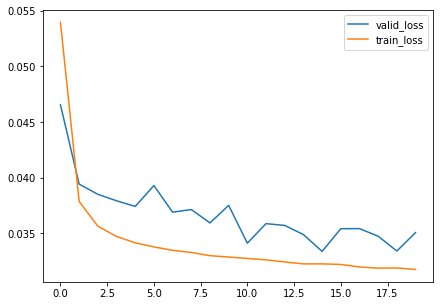

In [624]:
#plot train and validataion curve
plt.figure(figsize=(7,5))
x = range(len(model.history.history['loss'])) # x-axis
plt.plot(x, model.history.history['val_loss'], label= 'valid_loss') # val-loss
plt.plot(x, model.history.history['loss'], label= 'train_loss') # train-loss
plt.legend()
plt.show()

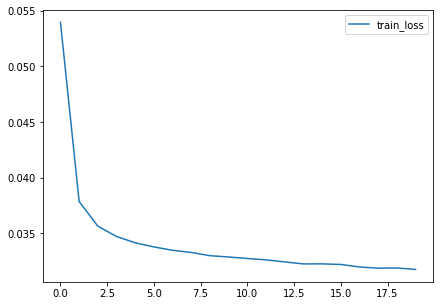

In [625]:
#plot train and validataion curve
plt.figure(figsize=(7,5))
x = range(len(model.history.history['loss'])) # x-axis
#plt.plot(x, model.history.history['val_loss'], label= 'val_loss') # val-loss
plt.plot(x, model.history.history['loss'], label= 'train_loss') # train-loss
plt.legend()
plt.show()

##### Show LSTM Architecture

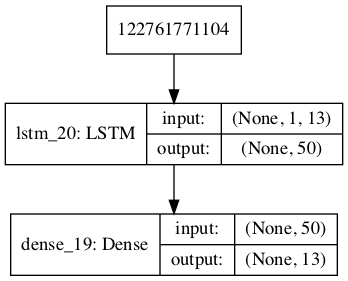

In [671]:
#show structure and save file as 'model.png'
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)
Image('model.png')

#### Prediction on Testset

In [627]:
#store prediction
prediction_values = []
current_batch = valid_data_scaled[-lag_time:].reshape(1, lag_time, feature_num) # reshape 3d

for x in range(len(test_set)): #predict as testsize
    predict_val=  model.predict(current_batch)[0] #predict and grap first value
    
    prediction_values.append(predict_val) # append
    current_batch = np.append(current_batch[:,lag_time:,:],[[predict_val]], axis=1) #concatenate
   

In [675]:
#store in dataframe
invert_data =scaler.inverse_transform(prediction_values) #back to original scale
lstm_prediction = pd.DataFrame({'CO(GT)_pd': invert_data[:,0], 'PT08.S1(CO)_pd': invert_data[:,1],
                                'NMHC(GT)_pd': invert_data[:,2], 'C6H6(GT)_pd': invert_data[:,3],
                                'PT08.S2(NMHC)_pd': invert_data[:,4], 'NOx(GT)_pd': invert_data[:,5],
                                'PT08.S3(NOx)_pd':invert_data[:,6], 'NO2(GT)_pd': invert_data[:,7],
                                'PT08.S4(NO2)_pd':invert_data[:,8],'PT08.S5(O3)_pd': invert_data[:,9], 
                                'T_pd':invert_data[:,10], 'RH_pd': invert_data[:,11], 
                                'AH_pd':invert_data[:,12]}) #return panda dataframe
lstm_prediction.set_index(pd.date_range('2005-03-23 22:00:00', periods= len(test_set), freq='H'), inplace=True) #set index
lstm_prediction.head(3)

,CO(GT)_pd,PT08.S1(CO)_pd,NMHC(GT)_pd,C6H6(GT)_pd,PT08.S2(NMHC)_pd,NOx(GT)_pd,PT08.S3(NOx)_pd,NO2(GT)_pd,PT08.S4(NO2)_pd,PT08.S5(O3)_pd,T_pd,RH_pd,AH_pd
2005-03-23 22:00:00,-3.231603,1553.760048,-200.004845,29.414991,1230.664716,361.870920,560.918186,169.276179,1658.690047,1597.710281,28.510420,70.218626,1.505077
2005-03-23 23:00:00,-6.540670,1509.306285,-200.008021,28.936790,1192.217618,331.980169,578.284805,163.258941,1622.532153,1521.888129,28.318093,69.702547,1.500078
2005-03-24 00:00:00,-8.722868,1473.612415,-200.010366,28.604380,1161.300601,305.747196,595.253074,158.827749,1592.186368,1450.809438,28.230557,69.197385,1.497321


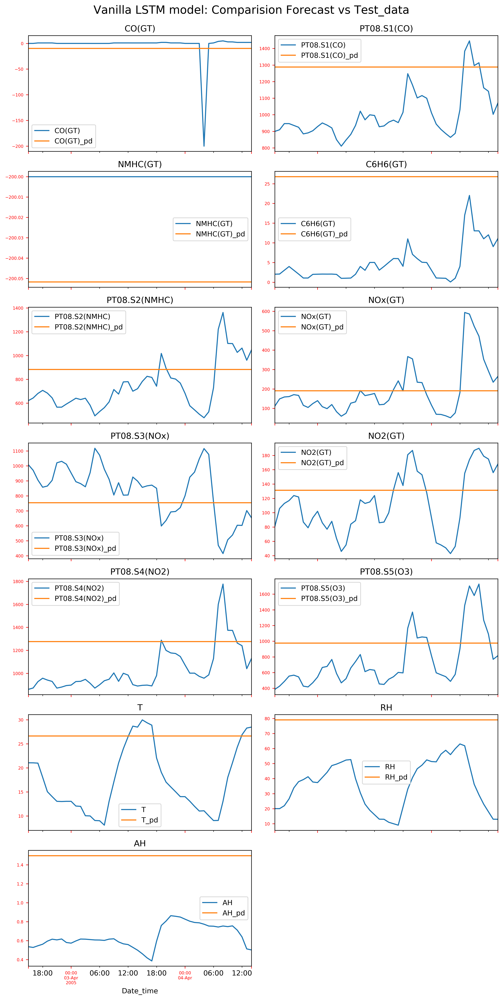

In [676]:
# create figures
fig, axes = plt.subplots(nrows= 7, ncols=2,  sharex=True, dpi=400, figsize=(10,20)) # 7 rows and 2 columns
fig.suptitle('Vanilla LSTM model: Comparision Forecast vs Test_data', fontsize=16) # figure title 

for i, ax in enumerate(axes.flatten()): # all subplots 
    
    if i < test_set.shape[1]: # check no. of columns in data frame
       
        #plot test data only last 24 hours
        data_te = test_set[test_set.columns[i]]
        data_te[-48:].plot(legend= True, ax= ax)
        
        #plot predicted data only last 24 hours
        data_pe = lstm_prediction[lstm_prediction.columns[i]]
        data_pe[-48:].plot(legend= True, ax= ax)

        

        # Decorations
        ax.set_title(test_set.columns[i]) # subplot tittle
        ax.tick_params(labelsize=6, colors='r')  
        ax.autoscale(axis='x', tight=True) # tight fit to x-axis
        
fig.delaxes(axes[-1][1] )# delete unused axes 
fig.tight_layout() # nicely fit subplots
fig.subplots_adjust(top=0.95) # adjust figure title
plt.show()

### Another way to Evaluate testset 
By using keras  predict_generator()

In [653]:
#prediction with keras predict_generator()
new_test = np.append(valid_data_scaled[-lag_time:],test_data_scaled, axis=0) # append last valitation series
test_generator = TimeseriesGenerator(new_test, new_test, 
                                       length = lag_time, 
                                       batch_size=1) # test generator

predicton_fit_gen = model.predict_generator(test_generator)
predicton_fit_gen

array([[ 0.9503424 ,  0.73759687, -0.0048447 , ...,  0.9320137 ,
         0.82040834,  0.995618  ],
       [ 0.828585  ,  0.45195526, -0.01583286, ...,  0.5896254 ,
         0.4480053 ,  0.6940719 ],
       [ 0.8155446 ,  0.49319318, -0.0127281 , ...,  0.58443564,
         0.5143921 ,  0.7168589 ],
       ...,
       [ 0.8963561 ,  0.37410325, -0.02960043, ...,  0.73163414,
         0.22436596,  0.6953902 ],
       [ 0.9268256 ,  0.37392235, -0.02337015, ...,  0.7749196 ,
         0.13458845,  0.6876266 ],
       [ 0.95508325,  0.2850599 , -0.0261726 , ...,  0.746165  ,
         0.03747073,  0.6210544 ]], dtype=float32)

In [659]:
#prediction in dataframe
tranform_data =scaler.inverse_transform(predicton_fit_gen) #back to original scale
index_range= pd.date_range('2005-03-23 22:00:00', periods= len(test_set), freq='H') #index
colunm_names= ['CO(GT)_pd', 'PT08.S1(CO)_pd', 'NMHC(GT)_pd', 'C6H6(GT)_pd', 'PT08.S2(NMHC)_pd', 'NOx(GT)_pd', 'PT08.S3(NOx)_pd', 'NO2(GT)_pd', 'PT08.S4(NO2)_pd', 
               'PT08.S5(O3)_pd','T_pd', 'RH_pd','AH_pd'] #columns name

lstm_predic_gen = pd.DataFrame(data= tranform_data, index= index_range, columns= colunm_names)
lstm_predic_gen.tail(2)


,CO(GT)_pd,PT08.S1(CO)_pd,NMHC(GT)_pd,C6H6(GT)_pd,PT08.S2(NMHC)_pd,NOx(GT)_pd,PT08.S3(NOx)_pd,NO2(GT)_pd,PT08.S4(NO2)_pd,PT08.S5(O3)_pd,T_pd,RH_pd,AH_pd
2005-04-04 13:00:00,-8.100763,1187.539795,-200.023376,20.428320,1066.312134,207.988129,685.220764,173.650925,1470.629517,1036.344238,25.068489,19.118187,1.159080
2005-04-04 14:00:00,-2.250013,1098.055298,-200.026169,18.316368,978.509033,161.767593,790.783508,161.410217,1366.097168,664.564819,24.438477,11.881944,1.084293


####  Visualize Test data vs Predicted values 

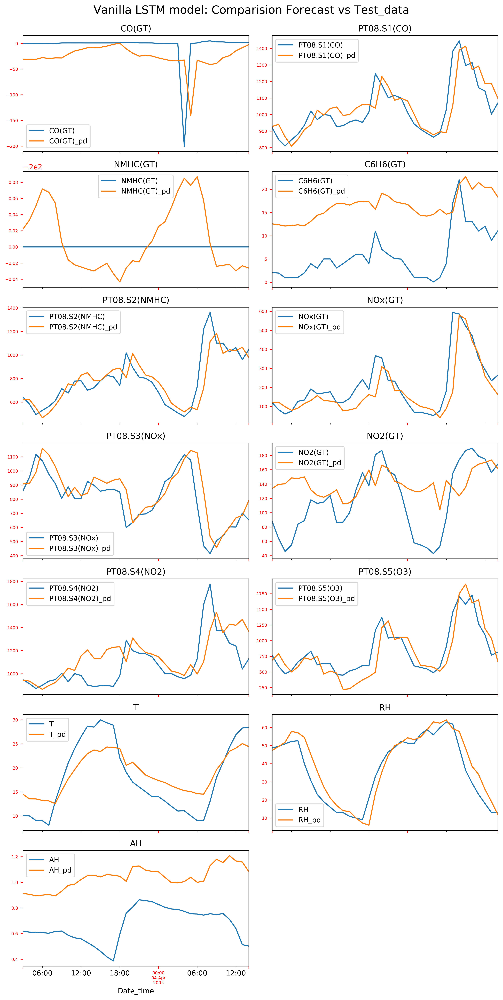

In [661]:
# create figures
fig, axes = plt.subplots(nrows= 7, ncols=2,  sharex=True, dpi=400, figsize=(10,20)) # 7 rows and 2 columns
fig.suptitle('Vanilla LSTM model: Comparision Forecast vs Test_data', fontsize=16) # figure title 

for i, ax in enumerate(axes.flatten()): # all subplots 
    
    if i < test_set.shape[1]: # check no. of columns in data frame
       
        #plot test data only last 36 hours
        data_te = test_set[test_set.columns[i]]
        data_te[-36:].plot(legend= True, ax= ax)
        
        #plot predicted data only last 24 hours
        data_pe = lstm_predic_gen[lstm_predic_gen.columns[i]]
        data_pe[-36:].plot(legend= True, ax= ax)

        

        # Decorations
        ax.set_title(test_set.columns[i]) # subplot tittle
        ax.tick_params(labelsize=6, colors='r')  
        ax.autoscale(axis='x', tight=True) # tight fit to x-axis
        
fig.delaxes(axes[-1][1] )# delete unused axes 
fig.tight_layout() # nicely fit subplots
fig.subplots_adjust(top=0.95) # adjust figure title
plt.show()



#### Evalutate

In [668]:
# metrix (rmse)
for x, y in zip(test_set, lstm_predic_gen): #
    rme = rmse(test_set[x], lstm_predic_gen[y]) # calcualte rmse
    print(f'{x} RMSE error: {rme}')
    print()

CO(GT) RMSE error: 37.411316881231826

PT08.S1(CO) RMSE error: 95.40494632100031

NMHC(GT) RMSE error: 0.04559674860039099

C6H6(GT) RMSE error: 12.960176308750516

PT08.S2(NMHC) RMSE error: 117.50174254690398

NOx(GT) RMSE error: 88.73230281611424

PT08.S3(NOx) RMSE error: 106.80745534182918

NO2(GT) RMSE error: 39.44655484760741

PT08.S4(NO2) RMSE error: 131.93078409850918

PT08.S5(O3) RMSE error: 179.95505741468378

T RMSE error: 4.333586108411818

RH RMSE error: 6.063739824312164

AH RMSE error: 0.24318659226147646



#### Forecast Future Values
Now, we have to train with all the data and build the final model. After geting final model, we will use that model for future forecast.

In [512]:
''' == build final model == '''

#scaled series
data_scaled = scaler.fit_transform(df) # scale (0,1)


#change series to supervised learning dataset
data_generator = TimeseriesGenerator(data_scaled, data_scaled, 
                                       length = lag_time, 
                                       batch_size= batch_size)


In [513]:
# call  create_lstm_model()
final_model = create_lstm_model(data_generator, lag_time, feature_num, 30 )

Model summary:
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_18 (LSTM)               (None, 50)                12800     
_________________________________________________________________
dense_17 (Dense)             (None, 13)                663       
Total params: 13,463
Trainable params: 13,463
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/30
9356/9356 [==============================] - 83s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495
Epoch 2/30
9356/9356 [==============================] - 77s 8ms/step - loss: 0.0346 - mean_absolute_error: 0.0346
Epoch 3/30
9356/9356 [==============================] - 80s 9ms/step - loss: 0.0327 - mean_absolute_error: 0.0327
Epoch 4/30
9356/9356 [==============================] - 75s 8ms/step - loss: 0.0321 - mean_absolute_error: 0.0321
Epoch 5/30
9356/9356 [==============================] - 83

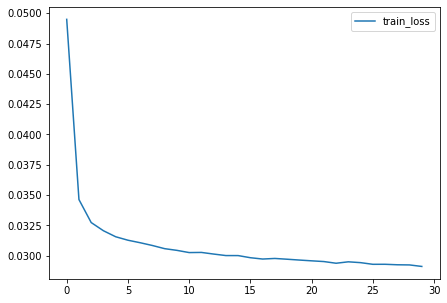

In [517]:
#plot train and validataion curve
plt.figure(figsize=(7,5))
x = range(len(final_model.history.history['loss'])) # x-axis
#plt.plot(x, model.history.history['val_loss'], label= 'val_loss') # val-loss
plt.plot(x, final_model.history.history['loss'], label= 'train_loss') # train-loss
plt.legend()
plt.show()

In [582]:
#store forecast values
forecast_values = []
current_batch = data_scaled[-lag_time:].reshape(1, lag_time, feature_num) # reshape 3 d

for x in range(12): # forecast next 12 hours
    predict_val=  final_model.predict(current_batch)[0]
    
    forecast_values.append(predict_val) # store values
    current_batch = np.append(current_batch[:,lag_time:,:],[[predict_val]], axis=1) # append 
   
    

In [583]:
#prediction in dataframe
tranform_data_fi =scaler.inverse_transform(forecast_values) #back to original scale
index_range_fi = pd.date_range('2005-04-04 14:00:00', periods= 12, freq='H') #index
colunm_names_fi= ['CO(GT)_pd', 'PT08.S1(CO)_pd', 'NMHC(GT)_pd', 'C6H6(GT)_pd', 'PT08.S2(NMHC)_pd', 'NOx(GT)_pd', 'PT08.S3(NOx)_pd', 'NO2(GT)_pd', 'PT08.S4(NO2)_pd', 
               'PT08.S5(O3)_pd','T_pd', 'RH_pd','AH_pd'] #columns name

lstm_predic_fi = pd.DataFrame(data= tranform_data_fi, index= index_range_fi, columns= colunm_names_fi)
lstm_predic_fi.tail(2)

,CO(GT)_pd,PT08.S1(CO)_pd,NMHC(GT)_pd,C6H6(GT)_pd,PT08.S2(NMHC)_pd,NOx(GT)_pd,PT08.S3(NOx)_pd,NO2(GT)_pd,PT08.S4(NO2)_pd,PT08.S5(O3)_pd,T_pd,RH_pd,AH_pd
2005-04-05 00:00:00,2.208380,1009.898319,-216.561865,5.22727,750.241017,376.429347,1031.052302,163.563347,601.998214,965.752142,-2.098127,47.937537,1.041458
2005-04-05 01:00:00,2.552169,1009.125938,-215.383751,5.36796,750.819149,398.578511,1043.491469,162.975042,568.015878,972.705627,-3.869978,51.178913,1.038490


#### Visualize Future Forecast

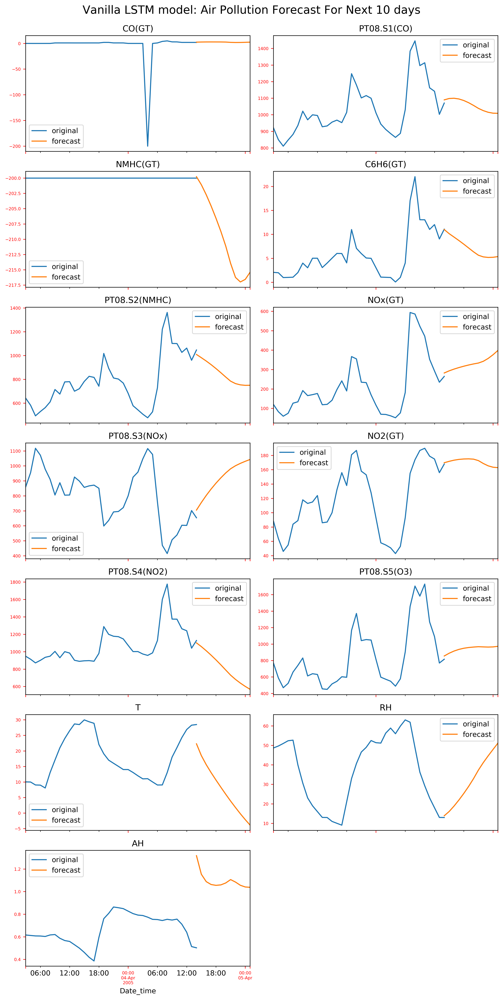

In [669]:
#plot forecast values
fig, axes = plt.subplots(nrows= 7, ncols=2,  sharex=True, dpi=400, figsize=(10,20)) # 7 rows and 2 columns
fig.suptitle('Vanilla LSTM model: Air Pollution Forecast For Next 10 days', fontsize=16) # figure title 

for i, ax in enumerate(axes.flatten()): # all subplots 
    
    if i < df.shape[1]: # check no. of columns in data frame
       
        #plot test data only last 36 hours
        data_df = df[df.columns[i]]
        data_df[-36:].plot(label='original', legend= True, ax= ax)
        
        #plot predicted data only last 12 hours
        data_pe = lstm_predic_fi[lstm_predic_fi.columns[i]]
        data_pe.plot( label='forecast', legend= True, ax= ax)

        

        # Decorations
        ax.set_title(df.columns[i]) # subplot tittle
        ax.tick_params(labelsize=6, colors='r')  
        ax.autoscale(axis='x', tight=True) # tight fit to x-axis
        
fig.delaxes(axes[-1][1] )# delete unused axes 
fig.tight_layout() # nicely fit subplots
fig.subplots_adjust(top=0.95) # adjust figure title
plt.show()

#### Conclusion:
In this work, the multi-variate series forecast is done with VAR, ARMAX and Vanilla LSTM. When compare
to these alogrihtms, the LSTM perfomed better. The main ideas of this work is how to buil forecast model for multi-variate series and do forecast to the future values beyond the dataset.